In [196]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from pandas import Series , DataFrame
from pylab import rcParams
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

In [197]:
from sklearn.metrics import recall_score

In [198]:
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

In [199]:
data = pd.read_csv(r"C:\Users\satti\Downloads\voice.csv")
data.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male


In [200]:
data

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,0.131884,0.084734,0.153707,0.049285,0.201144,0.151859,1.762129,6.630383,0.962934,0.763182,...,0.131884,0.182790,0.083770,0.262295,0.832899,0.007812,4.210938,4.203125,0.161929,female
3164,0.116221,0.089221,0.076758,0.042718,0.204911,0.162193,0.693730,2.503954,0.960716,0.709570,...,0.116221,0.188980,0.034409,0.275862,0.909856,0.039062,3.679688,3.640625,0.277897,female
3165,0.142056,0.095798,0.183731,0.033424,0.224360,0.190936,1.876502,6.604509,0.946854,0.654196,...,0.142056,0.209918,0.039506,0.275862,0.494271,0.007812,2.937500,2.929688,0.194759,female
3166,0.143659,0.090628,0.184976,0.043508,0.219943,0.176435,1.591065,5.388298,0.950436,0.675470,...,0.143659,0.172375,0.034483,0.250000,0.791360,0.007812,3.593750,3.585938,0.311002,female


The dataset has different attributes of “sound” for males and females:

●       meanfreq: Mean frequency of the voice signal

●       sd: Standard deviation of the frequency

●       median: Median frequency

●       Q25: First quantile (25%) of the frequency

●       Q75: Third quantile (75%) of the frequency

●       IQR: Interquartile range

●       skew: Skewness of the frequency distribution

●       kurt: Kurtosis, a measure of the "tailedness" of the frequency distribution

●       sp.ent: Spectral entropy, a measure of signal complexity

●       sfm: Spectral flatness measure

●       centroid: Frequency centroid (mean frequency)

●       meanfun: Mean fundamental frequency measured across acoustic signal

●       minfun: Minimum fundamental frequency measured across acoustic signal

●       maxfun: Maximum fundamental frequency measured across acoustic signal

●       meandom: Mean dominant frequency of the acoustic signal

●       mindom: Minimum dominant frequency of the acoustic signal

●       maxdom: Maximum dominant frequency of the acoustic signal

●       dfrange: Dominant frequency range

●       modindx: Modulation index

●       label: Male or female voice - the target variable

The objective is to build a model which will accurately predict and classify any sound as male or female based on its attributes.

In [201]:
from sklearn.preprocessing import LabelEncoder
y=data.iloc[:,-1]

In [202]:
gender_encoder = LabelEncoder()
y = gender_encoder.fit_transform(y)
y

array([1, 1, 1, ..., 0, 0, 0])

C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

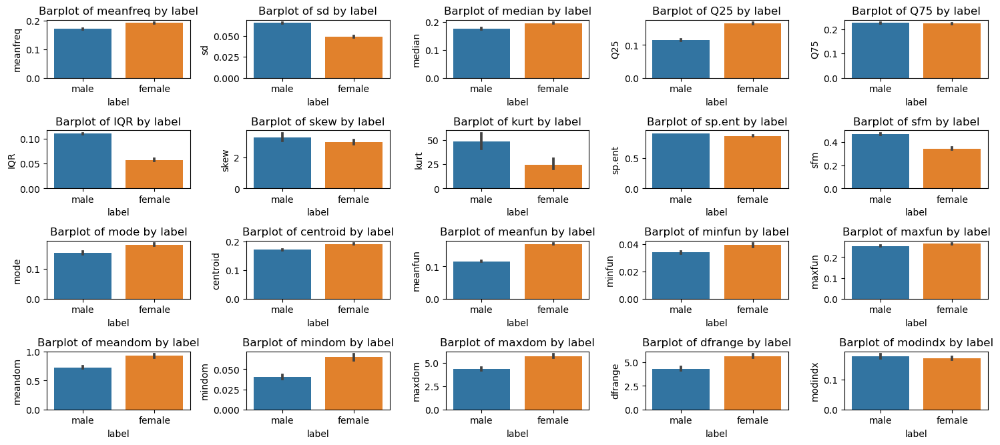

In [203]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=[15, 8])
features = ['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt', 'sp.ent', 'sfm', 'mode', 'centroid',
            'meanfun', 'minfun', 'maxfun', 'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx'] 
n = 1
for f in features:
    plt.subplot(5, 5, n)
    sns.barplot(x='label', y=f, data=data)
    plt.title("Barplot of {} by label".format(f))
    n = n + 1
plt.tight_layout()
plt.show()


In [204]:
#find out the median of all columns with respect to survived
data.groupby("label").median()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
label,,,,,,,,,,,,,,,,,,,,
female,0.192732,0.041965,0.198226,0.175373,0.223744,0.042689,2.435808,9.607635,0.865861,0.277228,0.193670,0.192732,0.169408,0.047013,0.274286,0.867405,0.023438,6.042969,5.964844,0.138995
male,0.176343,0.061781,0.180612,0.122315,0.228117,0.109940,1.880420,6.970088,0.917309,0.461636,0.157557,0.176343,0.117254,0.036166,0.271186,0.686687,0.023438,4.457031,4.429688,0.139904


In [205]:
data.isnull().sum()


meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

In [206]:
list=['meanfreq', 'sd', 'median', 'Q25', 'Q75',
       'IQR', 'skew', 'kurt', 'sp.ent','sfm','mode','centroid','meanfun','minfun','maxfun','meandom','mindom','maxdom','dfrange','modindx','label']

In [207]:
data.columns = data.columns.str.strip()

In [208]:
for l in list:
    print(f'{l}: {len(data[data[l] == 0])}')

meanfreq: 0
sd: 0
median: 0
Q25: 0
Q75: 0
IQR: 0
skew: 0
kurt: 0
sp.ent: 0
sfm: 0
mode: 236
centroid: 0
meanfun: 0
minfun: 0
maxfun: 0
meandom: 0
mindom: 0
maxdom: 0
dfrange: 65
modindx: 65
label: 0


In [209]:
zero_col=['mode','dfrange','modindx']
for i in zero_col:
    data[i] = data[i].replace(0, data[i].median()) # replacing all median with zero
data.isnull().sum()
col = []

In [210]:
for column in data.columns:
    if len(data[column].unique()) <= 500:
        col.append(column)
        print(f"{column} : {data[column].unique()}")
        print(f"{column} : {data[column].value_counts()}")
        print("=========================================")

maxfun : [0.27586207 0.25       0.27118644 0.26666667 0.25396825 0.14414414
 0.26229508 0.11764706 0.21333333 0.24615385 0.23188406 0.21052632
 0.2        0.19753086 0.19277108 0.22535211 0.17777778 0.20512821
 0.22857143 0.16842105 0.17204301 0.18181818 0.24242424 0.128
 0.20779221 0.23529412 0.25806452 0.20253165 0.19512195 0.21917808
 0.1509434  0.22222222 0.17582418 0.23880597 0.16       0.15686275
 0.17021277 0.18604651 0.18390805 0.19047619 0.16161616 0.27027027
 0.15625    0.23255814 0.24390244 0.27777778 0.26315789 0.21276596
 0.11363636 0.10309278 0.10869565 0.23809524 0.25641026 0.19607843
 0.20408163 0.14084507 0.11494253 0.16666667 0.15533981 0.21621622
 0.14285714 0.14159292 0.14678899 0.14035088 0.13675214 0.15841584
 0.14545455 0.16494845 0.13913043 0.13793103 0.15238095 0.15384615
 0.17977528 0.14953271 0.16393443 0.22727273 0.12987013 0.2173913
 0.12820513 0.14492754 0.18518519 0.20833333 0.11235955 0.17857143
 0.125      0.13888889 0.10526316 0.11111111 0.15873016 0.1

In [218]:
data.label.value_counts() # data is imbalanced SMOTE needs to be implied

label
male      1584
female    1584
Name: count, dtype: int64

C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\satti\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

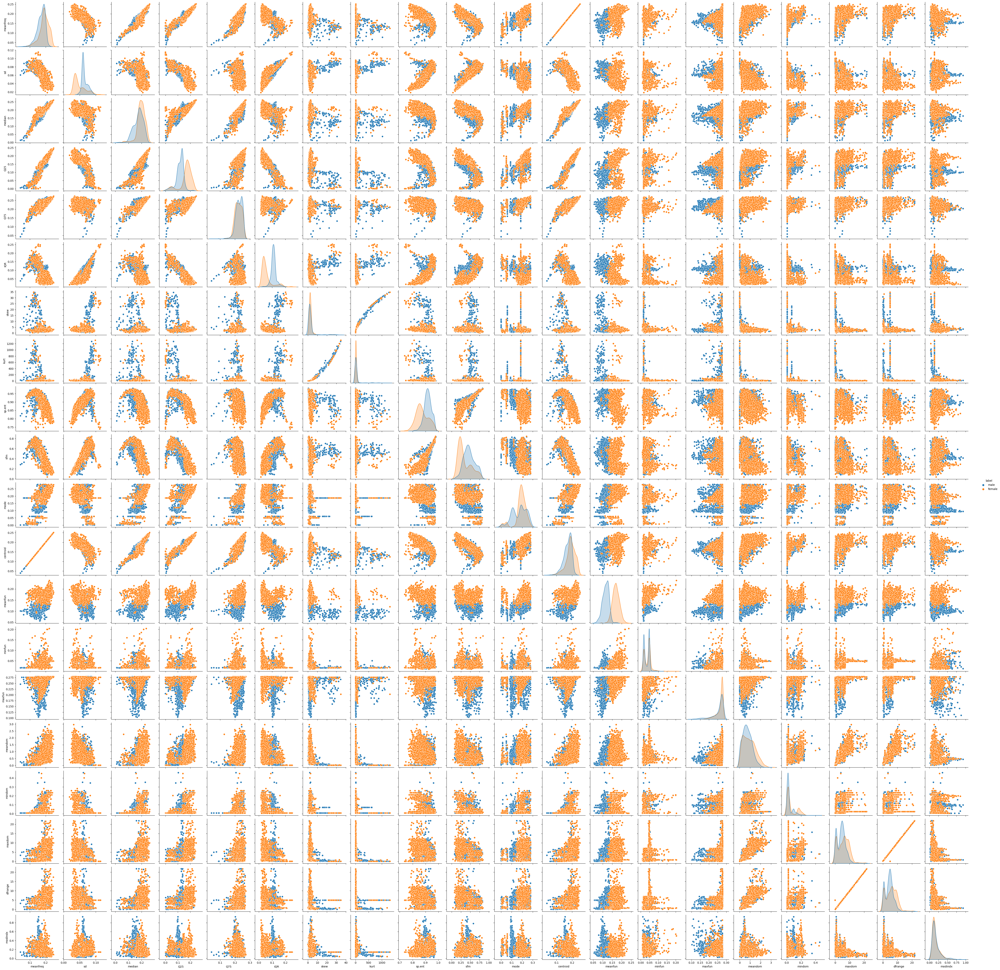

In [219]:
sns.pairplot(data = data, hue = 'label')

In [220]:
data

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,4.945312,0.139357,male
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,male
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,male
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,male
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,0.131884,0.084734,0.153707,0.049285,0.201144,0.151859,1.762129,6.630383,0.962934,0.763182,...,0.131884,0.182790,0.083770,0.262295,0.832899,0.007812,4.210938,4.203125,0.161929,female
3164,0.116221,0.089221,0.076758,0.042718,0.204911,0.162193,0.693730,2.503954,0.960716,0.709570,...,0.116221,0.188980,0.034409,0.275862,0.909856,0.039062,3.679688,3.640625,0.277897,female
3165,0.142056,0.095798,0.183731,0.033424,0.224360,0.190936,1.876502,6.604509,0.946854,0.654196,...,0.142056,0.209918,0.039506,0.275862,0.494271,0.007812,2.937500,2.929688,0.194759,female
3166,0.143659,0.090628,0.184976,0.043508,0.219943,0.176435,1.591065,5.388298,0.950436,0.675470,...,0.143659,0.172375,0.034483,0.250000,0.791360,0.007812,3.593750,3.585938,0.311002,female


In [221]:
data['label'] = data['label'].replace({'male': 0, 'female': 1})

In [222]:
countnotlabel  = len(data[data.label == 0])
countlabel= len(data[data.label == 1])
print("nt label %: {:.2f}%".format((countnotlabel / (len(data.label))*100)))
print("label %: {:.1f}%".format((countlabel/ (len(data.label))*100)))

nt label %: 50.00%
label %: 50.0%


In [223]:
data.corr()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
meanfreq,1.000000,-0.739039,0.925445,0.911416,0.740997,-0.627605,-0.322327,-0.316036,-0.601203,-0.784332,...,1.000000,0.460844,0.383937,0.274004,0.536666,0.229261,0.519528,0.477834,-0.262375,0.337415
sd,-0.739039,1.000000,-0.562603,-0.846931,-0.161076,0.874660,0.314597,0.346241,0.716620,0.838086,...,-0.739039,-0.466281,-0.345609,-0.129662,-0.482726,-0.357667,-0.482278,-0.426845,0.174763,-0.479539
median,0.925445,-0.562603,1.000000,0.774922,0.731849,-0.477352,-0.257407,-0.243382,-0.502005,-0.661690,...,0.925445,0.414909,0.337602,0.251328,0.455943,0.191169,0.438919,0.410453,-0.246731,0.283919
Q25,0.911416,-0.846931,0.774922,1.000000,0.477140,-0.874189,-0.319475,-0.350182,-0.648126,-0.766875,...,0.911416,0.545035,0.320994,0.199841,0.467403,0.302255,0.459683,0.404286,-0.194290,0.511455
Q75,0.740997,-0.161076,0.731849,0.477140,1.000000,0.009636,-0.206339,-0.148881,-0.174905,-0.378198,...,0.740997,0.155091,0.258002,0.285584,0.359181,-0.023750,0.335114,0.324611,-0.236435,-0.066906
IQR,-0.627605,0.874660,-0.477352,-0.874189,0.009636,1.000000,0.249497,0.316185,0.640813,0.663601,...,-0.627605,-0.534462,-0.222680,-0.069588,-0.333362,-0.357037,-0.337877,-0.280648,0.090429,-0.618916
skew,-0.322327,0.314597,-0.257407,-0.319475,-0.206339,0.249497,1.000000,0.977020,-0.195459,0.079694,...,-0.322327,-0.167668,-0.216954,-0.080861,-0.336848,-0.061608,-0.305651,-0.149626,-0.038786,-0.036627
kurt,-0.316036,0.346241,-0.243382,-0.350182,-0.148881,0.316185,0.977020,1.000000,-0.127644,0.109884,...,-0.316036,-0.194560,-0.203201,-0.045667,-0.303234,-0.103313,-0.274500,-0.114119,-0.073382,-0.087195
sp.ent,-0.601203,0.716620,-0.502005,-0.648126,-0.174905,0.640813,-0.195459,-0.127644,1.000000,0.866411,...,-0.601203,-0.513194,-0.305826,-0.120738,-0.293562,-0.294869,-0.324253,-0.359241,0.174794,-0.490552
sfm,-0.784332,0.838086,-0.661690,-0.766875,-0.378198,0.663601,0.079694,0.109884,0.866411,1.000000,...,-0.784332,-0.421066,-0.362100,-0.192369,-0.428442,-0.289593,-0.436649,-0.429864,0.225322,-0.357499


In [224]:
data.isnull().sum()

meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

In [225]:
data.shape

(3168, 21)

In [226]:
print("Total number of labels: {}".format(data.shape[0]))

Total number of labels: 3168


In [227]:
print("Number of male: {}".format(data[data.label == 0].shape[0]))

Number of male: 1584


In [228]:
print("Number of female: {}".format(data[data.label == 1].shape[0]))

Number of female: 1584


In [229]:
X=data.iloc[:, :-1]

In [230]:
X.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,0.186599,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,4.945312,0.139357
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,0.186599,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,0.186599,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,0.083878,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,0.104261,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274


In [231]:
from sklearn.preprocessing import LabelEncoder
y=data.iloc[:,-1]

In [232]:
gender_encoder = LabelEncoder()
y = gender_encoder.fit_transform(y)
y

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [233]:
# Scale the data to be between -1 and 1
from sklearn.preprocessing import StandardScaler

In [234]:
scaler = StandardScaler()

In [235]:
scaler.fit(X)

StandardScaler()

In [236]:
X = scaler.transform(X)

In [237]:
from sklearn.model_selection import train_test_split

In [238]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [239]:
X_train

array([[ 1.8620701 , -0.17159601,  1.76797458, ...,  0.00210497,
        -0.01428968,  0.21939524],
       [-0.16639879,  0.60676477, -0.25821859, ...,  0.27061383,
         0.26015032,  0.08917088],
       [ 0.87526512, -1.02179942,  0.76737659, ..., -0.13769716,
        -0.20934622,  0.40459695],
       ...,
       [ 0.42519742,  0.09125151,  0.75543621, ...,  0.2373276 ,
         0.22159264, -0.2286398 ],
       [-1.30836832,  1.16448382, -1.81602035, ..., -1.3892591 ,
        -1.4363879 ,  2.01629735],
       [ 0.45660937,  0.0354137 ,  0.88043049, ...,  0.97628173,
         0.97686968, -0.40988564]])

In [240]:
X_test

array([[ 0.89187283, -1.5334168 ,  0.6508095 , ...,  1.98152563,
         2.00431863, -0.74025525],
       [-1.0665621 ,  1.5884887 , -0.00793479, ..., -0.46612122,
        -0.49285862,  0.24123281],
       [-0.99654887,  1.75417784, -0.04693977, ..., -1.19176085,
        -1.23679517,  0.57934223],
       ...,
       [-0.91134776,  3.49240922,  0.86848471, ..., -1.43142165,
        -0.04377497, -0.31872829],
       [-1.9456548 ,  1.68711921, -1.09703006, ..., -0.36182439,
        -0.38852606,  0.11848566],
       [ 0.01720237, -0.08923729, -0.40529002, ...,  0.39710147,
         0.38489578, -0.32953165]])

In [241]:
y_train

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

In [242]:
y_test

array([1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,

In [243]:
lr=LogisticRegression()

In [244]:
lr.fit(X_train, y_train)

LogisticRegression()

In [245]:
y_pred=lr.predict(X_test)

In [246]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1,

In [247]:
print('Accuracy:', metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.9747634069400631


In [248]:
print('Precision:', metrics.precision_score(y_test, y_pred))

Precision: 0.9712460063897763


In [249]:
print('Recall:', metrics.recall_score(y_test, y_pred))

Recall: 0.977491961414791


In [250]:
print('F1:', metrics.f1_score(y_test, y_pred))

F1: 0.9743589743589743


In [251]:
lr.score(X_train,y_train) #train score

0.9779005524861878

In [252]:
lr.score(X_test,y_test) #test score

0.9747634069400631

In [253]:
confusion_matrix=pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
confusion_matrix

Predicted,0,1
Actual,,
0,314,9
1,7,304


<Axes: xlabel='Predicted', ylabel='Actual'>

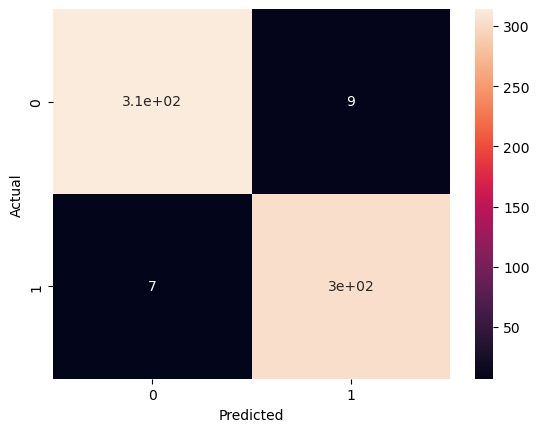

In [254]:
sns.heatmap(confusion_matrix, annot=True)

In [255]:
#applying decision tree on train data

In [256]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier()

In [257]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [258]:
y_pred = dtc.predict(X_test)

In [259]:
accuracy_default = accuracy_score(y_test, y_pred)

In [260]:
print("Accuracy of Default Decision Tree:", accuracy_default)

Accuracy of Default Decision Tree: 0.9779179810725552


In [261]:
train_score_default=dtc.score(X_train,y_train)
train_score_default

1.0

In [262]:
test_score_default=dtc.score(X_test,y_test)
test_score_default

0.9779179810725552

In [263]:
# Define hyperparameters grid for tuning
param_grid = {
    'max_depth': [3, 5, 7, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [264]:
from sklearn.model_selection import GridSearchCV

In [265]:
# Perform grid search cross-validation for hyperparameter tuning
dt_grid = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                       param_grid=param_grid,
                       scoring='accuracy',
                       cv=5,
                       n_jobs=-1)

In [266]:
# Fit the grid search model to the training data
dt_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [3, 5, 7, None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [267]:
# Get the best hyperparameters and model
best_params = dt_grid.best_params_
best_model = dt_grid.best_estimator_

In [268]:
# Predict on the test data using the best model
y_pred_best = best_model.predict(X_test)

In [269]:
# Evaluate the best model
accuracy_best = accuracy_score(y_test, y_pred_best)

In [270]:
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 10}


In [271]:
print("Accuracy of Best Decision Tree:", accuracy_best)

Accuracy of Best Decision Tree: 0.9716088328075709


In [272]:
train_score_tuned=dt_grid.score(X_train,y_train)
train_score_tuned

0.9861878453038674

In [273]:
test_score_tuned=dt_grid.score(X_test,y_test)
test_score_tuned

0.9716088328075709

In [274]:
# Define hyperparameters grid for tuning
param_grid1= {
    'max_depth': [2 , 4],
    'min_samples_split': [ 4, 5],
    'min_samples_leaf': [2, 3]
}

In [275]:
# Perform grid search cross-validation for hyperparameter tuning
dt_grid1 = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42),
                       param_grid=param_grid1,
                       scoring='accuracy',
                       cv=3,
                       n_jobs=-2)

In [276]:
# Fit the grid search model to the training data
dt_grid1.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-2,
             param_grid={'max_depth': [2, 4], 'min_samples_leaf': [2, 3],
                         'min_samples_split': [4, 5]},
             scoring='accuracy')

In [277]:
# Get the best hyperparameters and model
best_params1 = dt_grid1.best_params_
best_model1 = dt_grid1.best_estimator_

In [278]:
# Predict on the test data using the best model
y_pred_best1 = best_model1.predict(X_test)

In [279]:
# Evaluate the best model
accuracy_best1 = accuracy_score(y_test, y_pred_best1)

In [280]:
print("Best Hyperparameters:", best_params1)

Best Hyperparameters: {'max_depth': 4, 'min_samples_leaf': 2, 'min_samples_split': 4}


In [281]:
print("Accuracy of Best Decision Tree:", accuracy_best1)

Accuracy of Best Decision Tree: 0.9621451104100947


In [282]:
train_score_tuned1=dt_grid1.score(X_train,y_train)
train_score_tuned1

0.9806629834254144

In [283]:
test_score_tuned1=dt_grid1.score(X_test,y_test)
test_score_tuned1

0.9621451104100947

In [284]:
precision_best = precision_score(y_test, y_pred_best)

In [285]:
precision_best

0.9592476489028213

In [286]:
recall_best = recall_score(y_test, y_pred_best)

In [287]:
recall_best

0.9839228295819936

In [288]:
confusion_matrix_best=pd.crosstab(y_test, y_pred_best, rownames=['Actual'], colnames=['Predicted'])
confusion_matrix_best

Predicted,0,1
Actual,,
0,310,13
1,5,306


In [289]:
# Train RandomForestClassifier with default parameters

In [290]:
rf_default = RandomForestClassifier(random_state=42)

In [291]:
rf_default.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [292]:
# Predict and evaluate

In [293]:
y_pred_default = rf_default.predict(X_test)

In [294]:
accuracy_default = accuracy_score(y_test, y_pred_default)

In [295]:
print(f'Accuracy without hyperparameter tuning: {accuracy_default:.4f}')

Accuracy without hyperparameter tuning: 0.9763


In [296]:
train_score=rf_default.score(X_train,y_train)
train_score

1.0

In [297]:
test_score=rf_default.score(X_test,y_test)
test_score

0.9763406940063092

In [298]:
param_grid = {
    'n_estimators': [2, 3, 4],
    'max_depth': [1, 2, 3],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 4]
   # 'max_features': ['auto', 'sqrt', 'log2']
}

In [299]:
# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

In [300]:
# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, n_jobs=-1, verbose=2, scoring='accuracy')

In [301]:
# Fit GridSearchCV
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 81 candidates, totalling 810 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [1, 2, 3], 'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 3, 4],
                         'n_estimators': [2, 3, 4]},
             scoring='accuracy', verbose=2)

In [302]:
# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_rf = grid_search.best_estimator_

In [303]:
# Predict and evaluate
y_pred_best = best_rf.predict(X_test)
accuracy_best = accuracy_score(y_test, y_pred_best)

In [304]:
print(f'Best parameters: {best_params}')

Best parameters: {'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 4}


In [305]:
print(f'Accuracy with hyperparameter tuning: {accuracy_best:.4f}')

Accuracy with hyperparameter tuning: 0.9574


In [306]:
train_score_tuned_rf=best_rf.score(X_train,y_train)
train_score_tuned_rf

0.9534333070244673

In [307]:
test_score_tuned_rf=best_rf.score(X_test,y_test)
test_score_tuned_rf

0.9574132492113565

In [308]:
precision_best = precision_score(y_test, y_pred_best)

In [309]:
precision_best

0.9551282051282052

In [310]:
recall_best = recall_score(y_test, y_pred_best)

In [311]:
recall_best

0.9581993569131833

In [312]:
confusion_matrix_best=pd.crosstab(y_test, y_pred_best, rownames=['Actual'], colnames=['Predicted'])
confusion_matrix_best

Predicted,0,1
Actual,,
0,309,14
1,13,298


In [313]:
# Running SVM with default hyperparameter.
from sklearn.svm import SVC

In [314]:
from sklearn import metrics
svc=SVC() #Default hyperparameters

In [315]:
svc.fit(X_train,y_train)

SVC()

In [316]:
  y_pred=svc.predict(X_test)

In [317]:
   print('Accuracy Score:')

Accuracy Score:


In [318]:
    print(metrics.accuracy_score(y_test,y_pred))

0.9779179810725552


In [319]:
#applying svm with linear kernel

In [320]:
svc=SVC(kernel='linear')

In [321]:
svc.fit(X_train,y_train)

SVC(kernel='linear')

In [322]:
y_pred=svc.predict(X_test)

In [323]:
print('Accuracy Score:')

Accuracy Score:


In [324]:
print(metrics.accuracy_score(y_test,y_pred))

0.9794952681388013


In [325]:
#applyning svm with rbf kernel

In [326]:
svc=SVC(kernel='rbf')

In [327]:
svc.fit(X_train,y_train)

SVC()

In [328]:
y_pred=svc.predict(X_test)

In [329]:
print('Accuracy Score:')


Accuracy Score:


In [330]:
print(metrics.accuracy_score(y_test,y_pred))

0.9779179810725552


In [331]:
#applying svm with polynomial kernel

In [332]:
svc=SVC(kernel='poly')

In [333]:
svc.fit(X_train,y_train)

SVC(kernel='poly')

In [334]:
y_pred=svc.predict(X_test)

In [335]:
print('Accuracy Score:')

Accuracy Score:


In [336]:
print(metrics.accuracy_score(y_test,y_pred))

0.9621451104100947


In [337]:
#Performing K-fold cross validation with different kernels

When K-fold cross validation is done we can see different score in each iteration.This happens because when we use train_test_split method,the dataset get split in random manner into testing and training dataset.Thus it depends on how the dataset got split and which samples are training set and which samples are in testing set.

With K-fold cross validation we can see that the dataset got split into 10 equal parts thus covering all the data into training as well into testing set.

This is the reason we got 10 different accuracy score.

In [338]:
from sklearn.model_selection import cross_val_score

In [339]:
svc=SVC(kernel='linear')

In [340]:
scores = cross_val_score(svc, X, y, cv=20, scoring='accuracy') #cv is cross validation

In [341]:
print(scores)
#we can see above how the accuracy score is differentr every time. this shows the accuracy scores depends on how the dataset got splitted.

[0.93081761 0.89937107 0.99371069 0.93081761 0.96855346 0.98742138
 0.98742138 0.96226415 0.92405063 1.         0.98101266 1.
 1.         0.97468354 0.9556962  1.         0.98734177 0.92405063
 0.99367089 0.99367089]


In [342]:
scores.mean()

0.969727728684022

In [343]:
svc=SVC(kernel='rbf')

In [344]:
scores = cross_val_score(svc, X, y, cv=20, scoring='accuracy') #cv is cross validation

In [345]:
print(scores)

[0.93710692 0.9245283  0.98742138 0.9245283  0.94968553 0.98113208
 0.96855346 0.96855346 0.93037975 1.         1.         1.
 1.         0.97468354 0.96202532 1.         0.99367089 0.84177215
 0.99367089 0.99367089]


In [346]:
scores.mean()

0.9665691425841892

In [347]:
svc=SVC(kernel='poly')

In [348]:
scores = cross_val_score(svc, X, y, cv=20, scoring='accuracy') #cv is cross validation

In [349]:
scores.mean()

0.9489152933683626

linear and rbf kernels are giving better accuracy scores than polynomial.

In [350]:
# applying regularization parameter C and checking out the accuracy score with kernel as linear . the C parameter tells us the svm optimization how much we want to avoid misclassifying each training sample.

 For large values of C, the optimization will choose a smaller-margin hyperplane if that hyperplane does a better job of getting all the training points classified correctly. Conversely, a very small value of C will cause the optimizer to look for a larger-margin separating hyperplane,
even if that hyperplane misclassifies more points.


Thus for a very large values we can cause overfitting of the model and for a very small value of C we can cause underfitting.Thus the value of C must be chosen in such a manner that it generalised the unseen data well

In [351]:
import matplotlib.pyplot as plt
%matplotlib inline

In [352]:
C_range = list(range(1, 26))

acc_score = []

for c in C_range:
    svc = SVC(kernel='linear', C=c)
    scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
    acc_score.append(scores.mean())

print(f"Length of C_range: {len(C_range)}")
print(f"Length of acc_score: {len(acc_score)}")

plt.plot(C_range, acc_score, marker='o')
plt.xticks(np.arange(1, 26, 2))
plt.xlabel('Value of C for SVC')
plt.ylabel('Cross-Validated Accuracy')
plt.title('Cross-Validated Accuracy vs. C value for SVC')
plt.grid(True)
plt.show()


TypeError: 'list' object is not callable

In [ ]:
# from the plot we can see that accuracy has been close to 97% for C =1. and C=6 and then dropped further

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
import numpy as np

# Reduce the range of C values and use fewer folds
C_range = list(np.arange(0.1, 3.1, 0.5))
acc_score = []

for c in C_range:
    svc = SVC(kernel='linear', C=c)
    scores = cross_val_score(svc, X, y, cv=5, scoring='accuracy', n_jobs=-1)
    acc_score.append(scores.mean())

print(acc_score)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
import numpy as np

C_values = list(np.arange(0.1, 6, 0.1))
acc_score = []

for c in C_values:
    svc = SVC(kernel='linear', C=c)
    scores = cross_val_score(svc, X, y, cv=5, scoring='accuracy', n_jobs=-1)
    acc_score.append(scores.mean())

print(len(C_values))  
print(len(acc_score))

Taking kernel as rbf and taking different values gamma

Technically, the gamma parameter is the inverse of the standard deviation of the RBF kernel (Gaussian function), which is used as similarity measure between two points. Intuitively, a small gamma value define a Gaussian function with a large variance. In this case, two points can be considered similar even if are far from each other. In the other hand, a large gamma value means define a Gaussian function with a small variance
and in this case, two points are considered similar just if they are close to each other

In [ ]:
gamma_range=[0.0001,0.001,0.01,0.1,1,10,100]
acc_score=[]
for g in gamma_range:
    svc = SVC(kernel='rbf', gamma=g)
    scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
    acc_score.append(scores.mean())
print(acc_score)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

gamma_range=[0.0001,0.001,0.01,0.1,1,10,100]
# plot the value of gamma for SVM (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(gamma_range,acc_score)
plt.xlabel('Value of gamma for SVC ')
plt.xticks(np.arange(0.0001,100,5))
plt.ylabel('Cross-Validated Accuracy')

In [ ]:
gamma_range=[0.0001,0.001,0.01,0.1]
acc_score=[]
for g in gamma_range:
    svc = SVC(kernel='rbf', gamma=g)
    scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
    acc_score.append(scores.mean())
print(acc_score)

In [ ]:
gamma_range=[0.0001,0.001,0.01,0.1]

# plot the value of C for SVM (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(gamma_range,acc_score)
plt.xlabel('Value of gamma for SVC ')
plt.ylabel('Cross-Validated Accuracy')

In [ ]:
#Let us look into more detail for gamma values
gamma_range=[0.01,0.02,0.03,0.04,0.05]
acc_score=[]
for g in gamma_range:
    svc = SVC(kernel='rbf', gamma=g)
    scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
    acc_score.append(scores.mean())
print(acc_score)

In [ ]:
gamma_range=[0.01,0.02,0.03,0.04,0.05]

# plot the value of C for SVM (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(gamma_range,acc_score)
plt.xlabel('Value of gamma for SVC ')
plt.ylabel('Cross-Validated Accuracy')

In [ ]:
#Taking polynomial kernel with different degree

In [ ]:
degree=[2,3,4,5,6]
acc_score=[]
for d in degree:
    svc = SVC(kernel='poly', degree=d)
    scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
    acc_score.append(scores.mean())
print(acc_score)

In [ ]:
# plot the value of degree for SVM (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(degree,acc_score,color='r')
plt.xlabel('degrees for SVC ')
plt.ylabel('Cross-Validated Accuracy')

In [ ]:
#Now performing SVM by taking hyperparameter C=0.1 and kernel as linear
from sklearn.svm import SVC
svc= SVC(kernel='linear',C=0.1)
svc.fit(X_train,y_train)
y_predict=svc.predict(X_test)
accuracy_score= metrics.accuracy_score(y_test,y_predict)
print(accuracy_score)

In [ ]:
#With K-fold cross validation(where K=10)
svc=SVC(kernel='linear',C=0.1)
scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
print(scores)

In [ ]:
print(scores.mean())

In [353]:
#Now performing SVM by taking hyperparameter gamma=0.01 and kernel as rbf

In [354]:
from sklearn.svm import SVC
svc= SVC(kernel='rbf',C=0.1)
svc.fit(X_train,y_train)
y_predict=svc.predict(X_test)
accuracy_score= metrics.accuracy_score(y_test,y_predict)
print(accuracy_score)

0.9605678233438486


In [355]:
#With K-fold cross validation(where K=10)
svc=SVC(kernel='rbf',C=0.1)
scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
print(scores)

[0.92113565 0.94006309 0.94321767 0.95268139 0.96214511 0.99684543
 0.99053628 0.97160883 0.92088608 0.99050633]


In [356]:
print(scores.mean())

0.9589625843549093


In [357]:
#Now performing SVM by taking hyperparameter degree=3 and kernel as poly

In [358]:
svc=SVC(kernel='poly',degree=3)
scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy')
print(scores)

[0.92113565 0.93690852 0.92113565 0.93375394 0.94321767 1.
 0.98422713 0.96529968 0.88607595 0.9778481 ]


In [359]:
print(scores.mean())

0.9469602284071396


In [360]:
#Let us perform Grid search technique to find the best parameter

In [361]:
from sklearn.svm import SVC
svm_model= SVC()

In [362]:
tuned_parameters = {
 'C': (np.arange(0.1,1,0.1)) , 'kernel': ['linear'],
 'C': (np.arange(0.1,1,0.1)) , 'gamma': [0.01,0.02,0.03,0.04,0.05], 'kernel': ['rbf'],
 'degree': [2,3,4] ,'gamma':[0.01,0.02,0.03,0.04,0.05], 'C':(np.arange(0.1,1,0.1)) , 'kernel':['poly']
                   }

In [363]:
from sklearn.model_selection import GridSearchCV

In [364]:
model_svm = GridSearchCV(svm_model, tuned_parameters,cv=10,scoring='accuracy')

In [365]:
model_svm.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                         'degree': [2, 3, 4],
                         'gamma': [0.01, 0.02, 0.03, 0.04, 0.05],
                         'kernel': ['poly']},
             scoring='accuracy')

In [366]:
print(model_svm.best_score_)

0.9577666428060129


In [367]:
print(model_svm.best_params_)

{'C': 0.9, 'degree': 3, 'gamma': 0.05, 'kernel': 'poly'}


In [368]:
y_pred= model_svm.predict(X_test)

In [369]:
print(metrics.accuracy_score(y_pred,y_test))

0.9605678233438486


In [370]:
print(metrics.precision_score(y_pred,y_test))

0.9356913183279743


In [371]:
print(metrics.recall_score(y_pred,y_test))

0.9831081081081081
